# I will upload a structured version of this notebook with commentaries soon

In [165]:
import os
import tarfile #Read and write tar archive files¶
from six.moves import urllib #Six is a Python 2 and 3 compatibility library.
import glob2 #Glob1: Unix style pathname pattern expansion.
#Glob2: Version of the glob module that can capture patterns and supports recursive wildcards
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px #Plotly Express is a terse, consistent, high-level API for creating figures
from pandas.plotting import scatter_matrix

## Data collection

In [166]:
url = "https://raw.githubusercontent.com/ageron/handson-ml2/master/datasets/housing/housing.tgz" #url of the tgz file you want to download
root = "C:/Users/louri/Downloads" #put the root folder you want here

def download_file(url, root, name):

    path = os.path.join(root, 'datasets', name)
    os.makedirs(path, exist_ok=True)
    file_path = os.path.join(path, name+'.tgz')
    response = urllib.request.urlretrieve(url, file_path)
    print(response)
    
def extract_files(root, name):
    
    dir_path = os.path.join(root, 'datasets', name)
    file_path = os.path.join(dir_path, name+'.tgz')
    with tarfile.open(file_path, 'r:*') as tgz_file:
        tgz_file.extractall(dir_path)
        
    list_files = glob2.glob(os.path.join(dir_path,'*'))
    print(f'\nthere is {len(list_files)} in folder {dir_path}:\n')
    for i,f in enumerate(list_files):
        print(f'file n°{i+1}: {f}')
    
download_file(url, root, 'housing')
extract_files(root, 'housing')

('C:/Users/louri/Downloads\\datasets\\housing\\housing.tgz', <http.client.HTTPMessage object at 0x0000023414DA32C8>)

there is 2 in folder C:/Users/louri/Downloads\datasets\housing:

file n°1: C:/Users/louri/Downloads\datasets\housing\housing.csv
file n°2: C:/Users/louri/Downloads\datasets\housing\housing.tgz


## Data exploration

In [167]:
df_housing = pd.read_csv('C:/Users/louri/Downloads\datasets\housing\housing.csv')
df_housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [168]:
df_housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [169]:
df_housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [170]:
df_housing['ocean_proximity'].unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

<AxesSubplot:>

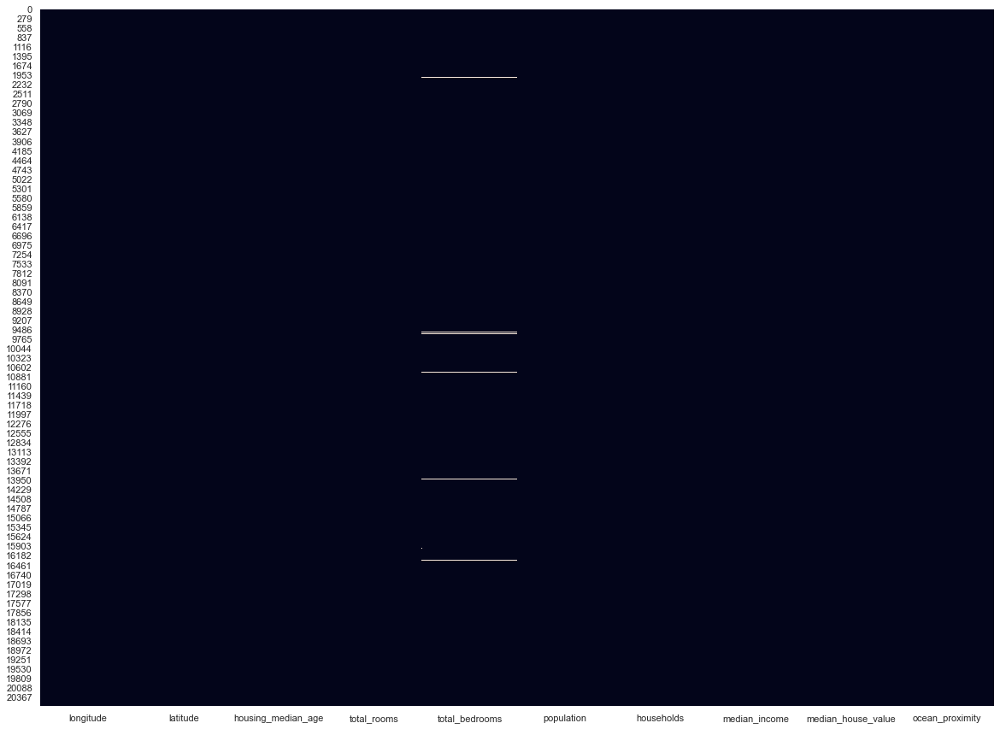

In [171]:
import seaborn as sns

sns.set_theme(style="whitegrid")

plt.figure(figsize=(20,15))
sns.heatmap(df_housing.isna(), cbar=False)

<Figure size 1080x720 with 0 Axes>

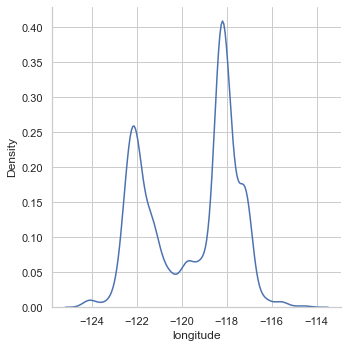

<Figure size 1080x720 with 0 Axes>

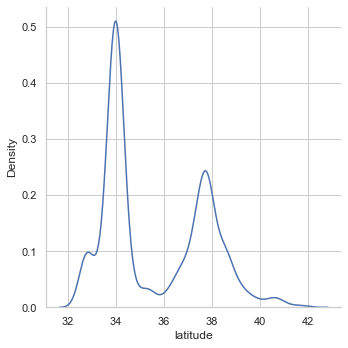

<Figure size 1080x720 with 0 Axes>

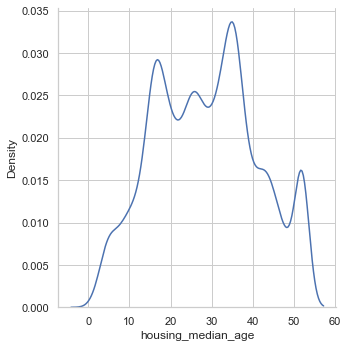

<Figure size 1080x720 with 0 Axes>

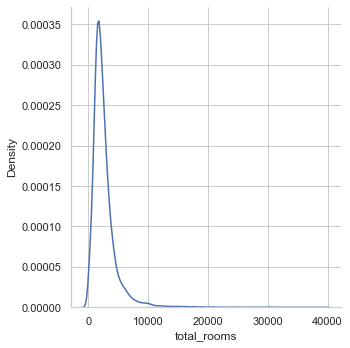

<Figure size 1080x720 with 0 Axes>

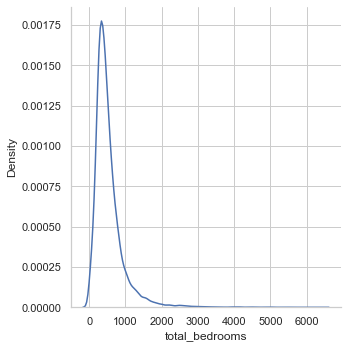

<Figure size 1080x720 with 0 Axes>

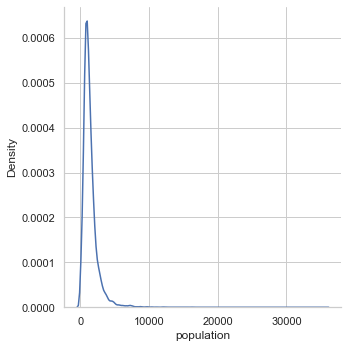

<Figure size 1080x720 with 0 Axes>

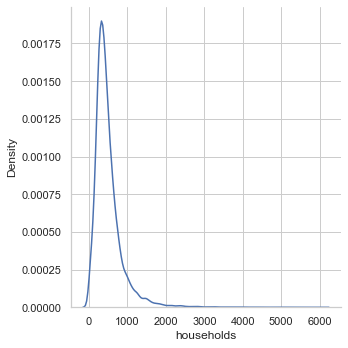

<Figure size 1080x720 with 0 Axes>

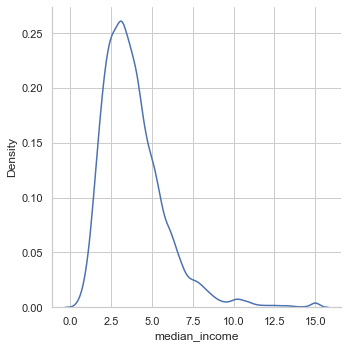

<Figure size 1080x720 with 0 Axes>

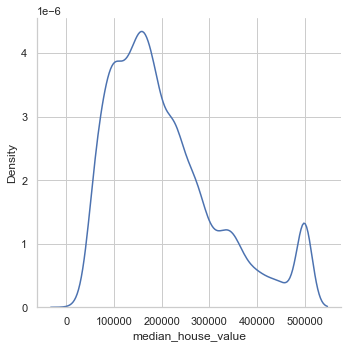

In [172]:

import matplotlib.pyplot as plt

for variable in df_housing.select_dtypes('float'):
        plt.figure(figsize=(15,10))
        sns.displot(df_housing[variable],kind='kde')

In [173]:
df_housing.columns[:-1]

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value'],
      dtype='object')

In [174]:
#visualization method with matplotlib and seaborn:

def visualize(df, columns, n_col=2, size=6, graph='histplot', data_axis='x', other_params=None):
    
    if(len(columns)%n_col == 0):
        n_row = len(columns)//n_col
    else:
        n_row = len(columns)//n_col + 1
    fig, axs = plt.subplots(n_row, n_col,clear=True)
    fig.set_size_inches(1+(size*n_col), (size*n_row))
    axs = axs.flatten()
    for i, col in enumerate(columns):
        if other_params:
            eval("sns."+graph+"("+data_axis+" = df[col], ax=axs[i], "+other_params+")")
        else:
            eval("sns."+graph+"("+data_axis+" = df[col], ax=axs[i])")

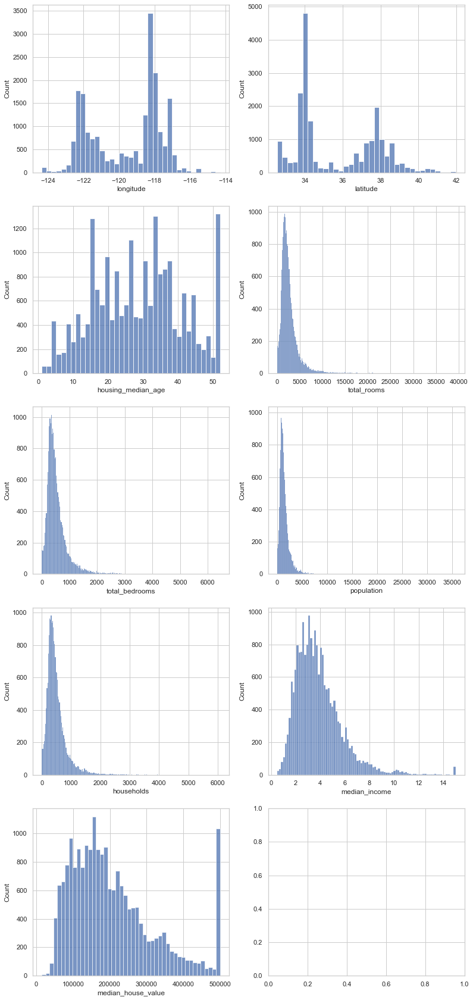

In [175]:
visualize(df_housing, df_housing.columns[:-1], graph='histplot', data_axis='x')

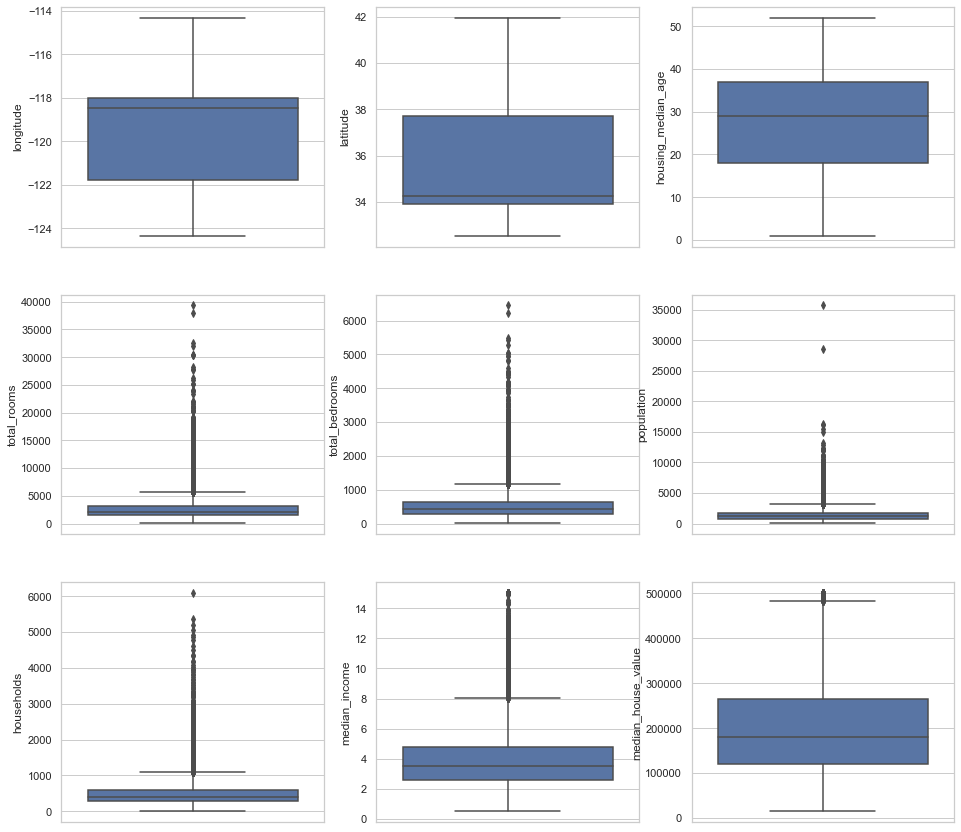

In [176]:
visualize(df_housing, df_housing.columns[:-1], n_col=3, size=5, graph='boxplot', data_axis='y')

In [177]:
#visualization method with plotly:

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import time
import math

def get_combi(list1, list2):
    
    res = []
    for i in list1:
        for j in list2:
            res.append((i,j))
    return res

def visualize_plotly(df, columns, n_cols=2, size=200, graph='Box', data_axis='x', other_params=None):
    
    start = time.time()
    if (len(columns)%n_cols==0):
        n_rows = len(columns)//n_cols
    else:
        n_rows = len(columns)//n_cols + 1
        
    combis = get_combi(range(1,n_rows+1), range(1,n_cols+1))
        
    fig = make_subplots(n_rows, n_cols)
    
    for i, col in enumerate(columns):
        combi = combis[i]
        if(other_params):
            eval('fig.add_trace(go.'+graph+'('+data_axis+'=df[col], name=col, '+other_params+'), row=combi[0], col=combi[1])')
        else:
            eval('fig.add_trace(go.'+graph+'('+data_axis+'=df[col], name=col), row=combi[0], col=combi[1])')
        
    fig.update_layout(height=200+(size*n_rows), width=500+(size*n_cols), title_text=graph+' plots')
    fig.show()
    end = time.time()
    print(f'\n processing time: {end-start}')
        
visualize_plotly(df_housing, df_housing.columns, n_cols=5, size=100, graph='Histogram', data_axis='x', other_params="histnorm='probability density'")


 processing time: 0.8490064144134521


In [ ]:
#visualization method with plotly with getattr instead of eval:

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import time
import math

def get_combi(list1, list2):
    
    res = []
    for i in list1:
        for j in list2:
            res.append((i,j))
    return res

def visualize_plotly2(df, columns, n_cols=2, size=200, graph='Box', data_axis = 'x', **kwargs):

    start = time.time()
    if (len(columns)%n_cols==0):
        n_rows = len(columns)//n_cols
    else:
        n_rows = len(columns)//n_cols + 1
        
    combis = get_combi(range(1,n_rows+1), range(1,n_cols+1))
        
    fig = make_subplots(n_rows, n_cols)
    
    for i, col in enumerate(columns):
        combi = combis[i]
        if(data_axis == 'y'):
            fig.add_trace(getattr(go, graph)(y=df[col], name=col), row=combi[0], col=combi[1])
        else:
            fig.add_trace(getattr(go, graph)(x=df[col], name=col), row=combi[0], col=combi[1])
        
    fig.update_layout(height=200+(size*n_rows), width=500+(size*n_cols), title_text=graph+' plots')
    fig.show()
    end = time.time()
    print(f'\n processing time: {end-start}')
        
visualize_plotly2(df_housing, df_housing.columns, n_cols=4, size=200, graph='Histogram', data_axis = 'x', **{'image__endswith': 'jpg'})

In [ ]:
visualize_plotly(df_housing, df_housing.columns, n_cols=2, graph='Box', data_axis='y', size=200)

In [178]:
mean_info = pd.DataFrame(df_housing.describe().loc['mean',:]).transpose()
mean_info

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.53968,3.870671,206855.816909


In [179]:
import plotly.express as px

df = mean_info.transpose()
df
px.bar(df, x=df.index, y='mean')

<AxesSubplot:>

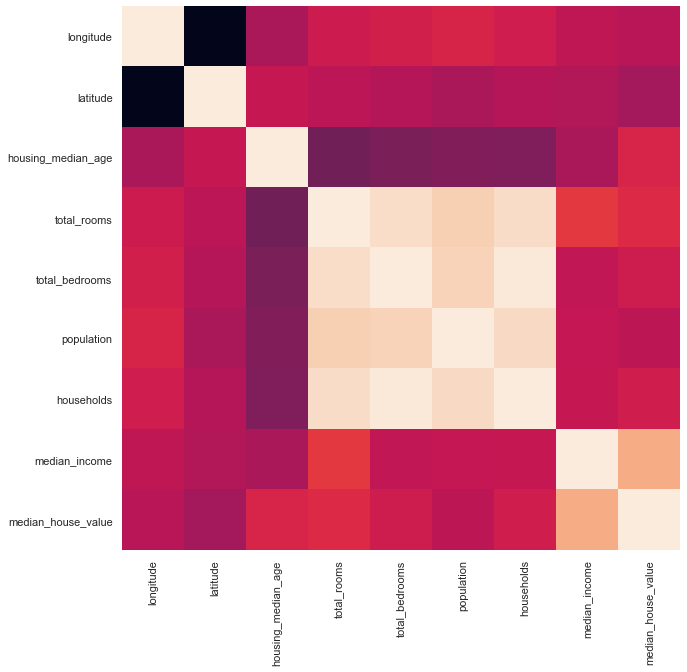

In [180]:
#Confusion matrix

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,10))
sns.heatmap(df_housing.corr(), cbar=False)


In [181]:
#Method example for feature engeneering

def create_ratio(df, list_var1, list_var2): 
    
    assert len(list_var1) == len(list_var2)
    
    df_fe = df.copy()
    
    for var1, var2 in zip(list_var1, list_var2):
        var_name = var1+'/'+var2
        df_fe[var_name] = df[var1]/df[var2]
    
    return df_fe

list_var1 = ['total_rooms', 'population', 'population']
list_var2 = ['total_bedrooms', 'median_income', 'total_bedrooms']

df_fe = create_ratio(df_housing, list_var1, list_var2)

In [182]:
df_fe['ocean_proximity'].unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

In [183]:
tab = df_fe[['ocean_proximity', 'median_income']].groupby('ocean_proximity').mean().reset_index()
tab

,ocean_proximity,median_income
0,<1H OCEAN,4.230682
1,INLAND,3.208996
2,ISLAND,2.744420
3,NEAR BAY,4.172885
4,NEAR OCEAN,4.005785


In [184]:
pd.DataFrame(df_fe.describe()['median_income']).transpose()

,count,mean,std,min,25%,50%,75%,max
median_income,20640.0,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001


In [185]:
px.bar(tab, x='ocean_proximity', y='median_income')

In [186]:
df_fe.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_rooms/total_bedrooms,population/median_income,population/total_bedrooms
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,6.821705,38.677749,2.496124
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,6.418626,289.228323,2.170886
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,7.721053,68.344035,2.610526
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,5.421277,98.881820,2.374468
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,5.810714,146.898237,2.017857


In [187]:
visualize_plotly(df_fe, df_fe.columns[10:], n_cols=3, graph='Histogram', size=200)


 processing time: 0.4329996109008789


In [188]:
visualize_plotly(df_fe, df_fe.columns[10:], n_cols=3, graph='Box', data_axis='y')


 processing time: 0.5230424404144287


In [189]:
df_fe.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_rooms/total_bedrooms,population/median_income,population/total_bedrooms
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,6.821705,38.677749,2.496124
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,6.418626,289.228323,2.170886
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,7.721053,68.344035,2.610526
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,5.421277,98.881820,2.374468
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,5.810714,146.898237,2.017857


In [190]:
visualize_plotly(df_fe, ['population/median_income'], n_cols=1, graph='Histogram', size=200)


 processing time: 0.13604164123535156


In [191]:
df_fe['pop/income_norm'] = df_fe['population/median_income'].apply(math.log10)
visualize_plotly(df_fe, ['pop/income_norm'], n_cols=1, graph='Histogram', size=200)


 processing time: 0.11104226112365723


In [192]:
df_fe.drop(columns=['pop/income_norm'], inplace=True)

In [193]:
visualize_plotly(df_fe, df_fe.columns[10:], graph='Box', data_axis='y', n_cols=3)


 processing time: 0.476043701171875


# Geoplot
### Are the expensive houses more near beach ?

In [194]:
df_fe.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_rooms/total_bedrooms,population/median_income,population/total_bedrooms
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,6.821705,38.677749,2.496124
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,6.418626,289.228323,2.170886
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,7.721053,68.344035,2.610526
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,5.421277,98.881820,2.374468
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,5.810714,146.898237,2.017857


In [195]:
df_housing_house_values = df_fe[['ocean_proximity', 'median_house_value']].groupby('ocean_proximity').mean().reset_index()
df_housing_house_values

,ocean_proximity,median_house_value
0,<1H OCEAN,240084.285464
1,INLAND,124805.392001
2,ISLAND,380440.000000
3,NEAR BAY,259212.311790
4,NEAR OCEAN,249433.977427


In [196]:
import plotly.express as px

px.bar(df_housing_house_values, x='ocean_proximity', y='median_house_value')

In [197]:
df_housing['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [198]:
visualize_plotly(df_fe, df_fe.columns[0:2], graph='Box', data_axis='y')


 processing time: 0.16900253295898438


In [199]:
# We can see that is centered to lat(32-42) and long(-124, -114)

df_fe['population'].values

array([ 322., 2401.,  496., ..., 1007.,  741., 1387.])

In [200]:
df_fe['binned'] = pd.cut(df_fe['population'].values, bins=100, labels=False)
df_fe.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,total_rooms/total_bedrooms,population/median_income,population/total_bedrooms,binned
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,6.821705,38.677749,2.496124,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,6.418626,289.228323,2.170886,6
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,7.721053,68.344035,2.610526,1
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,5.421277,98.881820,2.374468,1
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,5.810714,146.898237,2.017857,1


In [201]:
np.unique(df_fe['binned'].values)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34,
       36, 37, 42, 43, 45, 80, 99], dtype=int64)

In [202]:
import plotly.express as px

fig = px.scatter_mapbox(df_fe, lat='latitude', lon='longitude', color='population', size='median_house_value', color_continuous_scale=px.colors.carto.Sunset , size_max=8 ,opacity=0.8,
                  mapbox_style="carto-positron")
fig.show()

# Original features

In [ ]:
visualize_plotly(df_fe, ['total_rooms'], graph='Histogram', n_cols=1, size=300)

In [ ]:
visualize_plotly(df_fe, ['total_rooms'], graph='Histogram', n_cols=1, size=300, other_params='nbinsx=50')

In [ ]:
# transform with box cox:

from scipy.stats import boxcox
import time

start1 = time.time()
df_fe['total_rooms_w_boxcox'] = boxcox(df_fe['total_rooms'], lmbda=0)
print(f"temps d'exec avec boxcox: {time.time()-start1}")
start2 = time.time()
df_fe['total_rooms_w_log'] = df_fe['total_rooms'].apply(math.log)
print(f"temps d'exec avec apply: {time.time()-start2}")
start3 = time.time()
df_fe['total_rooms_w_log10_numpy'] = np.log10(df_fe['total_rooms'].values)
print(f"temps d'exec avec log10 de numpy: {time.time()-start3}")
start4 = time.time()
df_fe['total_rooms_w_sqrt_numpy'] = np.sqrt(df_fe['total_rooms'].values)
print(f"temps d'exec avec sqrt de numpy: {time.time()-start4}")

In [ ]:
visualize_plotly(df_fe, ['total_rooms_w_boxcox', 'total_rooms_w_log', 'total_rooms_w_log10_numpy', 'total_rooms_w_sqrt_numpy'], graph='Histogram', n_cols=2)

In [ ]:
df_fe.columns

In [ ]:
df_fe[df_fe.columns[2:10]]

In [ ]:
import plotly.express as px

fig = px.scatter_matrix(df_fe, dimensions=["median_house_value", "median_income", "total_rooms", "housing_median_age"],color='ocean_proximity')
fig.update_layout(title='scatter plots matrix', height=600, width=1200)
fig.show()

In [ ]:
visualize_plotly(df_fe, ['median_house_value'], graph='Histogram', n_cols=1)

In [ ]:
visualize_plotly(df_fe, ['housing_median_age'], graph='Histogram', n_cols=1)

In [ ]:
df_fe

In [ ]:
X = df_fe.to_numpy()
X

In [ ]:
visualize_plotly(df_fe, ['median_income'], graph='Histogram', n_cols=1)

# Train test split homemade

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X = df_fe.to_numpy()
X

In [ ]:
import random
import time

def train_test_split_my_version(data, test_size):
    
    start = time.time()
    test_ids = random.sample(range(0, data.shape[0]-1), int(data.shape[0]*test_size))
    train_ids = [i for i in range(0, data.shape[0]-1) if i not in test_ids]
    test_set = data[test_ids]
    train_set = data[train_ids]
    print(f'Time processing of first version: {time.time()-start} sec')
    return train_set, test_set

def train_test_split_second_version(data, test_size):
    
    start = time.time()
    shuffle_ids = np.random.permutation(range(0, data.shape[0]-1))
    test_ids = shuffle_ids[:int(data.shape[0]*test_size)]
    train_ids = shuffle_ids[int(data.shape[0]*test_size):]
    test_set = data[test_ids]
    train_set = data[train_ids]
    print(f'Time processing of second version: {time.time()-start} sec')
    return train_set, test_set

    

X_train, X_test = train_test_split_my_version(X, 0.3)
X_train2, X_test2 = train_test_split_second_version(X, 0.3)

In [ ]:
print(f'Shape of train for first version {X_train.shape}') 
print(f'Shape of train for second version {X_train2.shape}') 

In [ ]:
list(range(6))

In [ ]:
np.ones(4)

In [ ]:
np.zeros((4,10)) 

In [ ]:
A = np.arange(6).reshape((3,2))

A

In [ ]:
B = np.arange(3).reshape(3,1)
B

In [ ]:
np.hstack((A,B))

In [ ]:
np.c_[A,B]

In [ ]:
type(A)

# Data preparation

In [ ]:
from sklearn.compose import ColumnTransformer 
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class CombineAttributeAdder(BaseEstimator, TransformerMixin):
    
    def __init__(self, cols, cols_to_add):   
        self.cols = cols
        self.cols_to_add = cols_to_add
        self.new_cols = {}
        
        
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        
        if type(X) != np.ndarray:
            X = X.values
        
        for col in self.cols_to_add:
            var_to_ratio = col.split('/')
            var1 = var_to_ratio[0]
            var2 = var_to_ratio[1]
            self.new_cols[col] = X[:,self.cols.index(var1)]/X[:,self.cols.index(var2)]
            
        for k,v in self.new_cols.items():
                             
            X = np.c_[X, v]
        
        return X
            
estimator = CombineAttributeAdder(list(df_housing.columns), ['total_rooms/total_bedrooms','median_house_value/median_income','population/housing_median_age'])        

In [ ]:
X = df_housing.values
X.shape

In [ ]:
X2 = estimator.transform(X)
X2.shape

In [ ]:
X = df_housing.values
X.shape

In [ ]:
X = X[:,:-1]
X

In [ ]:
df_housing.head()

In [ ]:
mypipeline = Pipeline([
    ("scaler", StandardScaler()), 
    ("combine_attributes", CombineAttributeAdder(list(df_housing.columns), ['total_rooms/total_bedrooms','median_house_value/median_income','population/housing_median_age']))
])


In [ ]:
Y = mypipeline.fit_transform(X)

In [ ]:
Y.shape

In [ ]:
Y

In [ ]:
estimator.new_cols

In [ ]:
estimator.fit(X)